<b>Проект "Рынок заведений общественного питания Москвы"</b> 

<b>1. Описание проекта</b>  

В рамках проекта проводится исследование рынка заведений общественного питания Москвы для инвестиционного фонда «Shut Up and Take My Money»  с целью определения определения подходящего места для открытия нового заведения.  
Задачей проекта является выявление интересных особенностей и презентация полученных результатов в информативной и лаконичной форме.  

Описание данных.  
Исследование  проводится на данных датасета с заведениями общественного питания Москвы, составленного на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.  

В ходе предобработки данных будет проведен поиск и устранение дубликатов и пропусков, данные будут приведены в формат, удобный для исследований.
В ходе исследования предстоить определить:  
- какие категории заведений представлены в данных  
- количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее с построением визуализации  
- распределение заведений по категориям  
- количество посадочных мест в местах по категориям с построением визуализации  
- анализ промежуточных результатов и формулирование выводов  
- соотношение сетевых и несетевых заведений в датасете  
- определение категорий заведений, которые  чаще являются сетевыми  
- определение топ-15 популярных сетей в Москве  
- определение административных районов Москвы,присутствующих в датасете  
- отображение общего количества заведений и количество заведений каждой категории по районам с иллюстрацией на графике  
- визуализация распределения средних рейтингов по категориям заведений с выводами  
- построение фоновой картограммы (хороплет) со средним рейтингом заведений каждого района  
- определение топ-15 улиц по количеству заведений с построением графика распределения количества заведений и их категорий по этим улицам  
- определение улиц, на которых находится только один объект общепита с выводами  
- определение ценового индикатора  района с построением фоновой картограммы (хороплет) с полученными значениями для каждого района  
- анализ цен в центральном административном округе и других с выявлением взаимосвязи удалённости от центра и цены в заведениях 

По факту проведенного этапа исследования будут сформированы промежуточные выводы.  
Следующим этапом исследования является определение перспективности открытия популярной и доступной кофейни в Москве.
  
В ходе исследования на данном этапе предстоит определить:  
- количество кофеен в Москве  
- в каких районах их больше всего  
- каковы особенности их расположения  
- есть ли круглосуточные кофейни  
- какие у кофеен рейтинги, как они распределяются по районам  
- на какую стоимость чашки капучино стоит ориентироваться при открытии и почему  

Вся вышеуказанная информация будет визуализирована.  
На основании полученных данных будут сформированы рекомендации для открытия нового заведения.  
  
Заключительным этапом проектной работы является подготовка презентации исследования с ключевыми тезисами и наблюдениями. 

<b> 2. Предобработка данных </b>

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
from folium import Map, Choropleth
!pip install missingno
import missingno as msno
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

In [2]:
data=pd.read_csv('/datasets/moscow_places.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете представлены данные о 8406 заведений.  
Столбцы  name, category, address, district, hours, price, avg_bill имеют тип object.  
Cтолбцы lat, lng,rating, middle_avg_bill, middle_coffee_cup, seats имеют тип float64.    
Cтолбец chain имеет тип int64.

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data['name']=data['name'].str.lower()
data['category']=data['category'].str.lower()
data['address']=data['address'].str.lower()
data['name'] = data['name'].str.replace('"','')
data['name'] = data['name'].str.replace('ё','е')
data['name'] = data['name'].str.strip()
data['address']=data['address'].str.strip()
data['category']=data['category'].str.strip()
data.duplicated().sum()

0

Полные дубликаты в данных не выявлены

In [5]:
data_duplicated=data[data.duplicated(['category', 'lat', 'lng'])]
data_duplicated.count()

name                 18
category             18
address              18
district             18
hours                17
lat                  18
lng                  18
rating               18
price                 2
avg_bill              3
middle_avg_bill       3
middle_coffee_cup     0
chain                18
seats                10
dtype: int64

Выявлено 18 неполных дубликатов по сумме параметров - категория, место расположения.

In [6]:
data=data.drop_duplicates(subset=['category', 'lat', 'lng'])
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8388 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8388 non-null   object 
 1   category           8388 non-null   object 
 2   address            8388 non-null   object 
 3   district           8388 non-null   object 
 4   hours              7853 non-null   object 
 5   lat                8388 non-null   float64
 6   lng                8388 non-null   float64
 7   rating             8388 non-null   float64
 8   price              3313 non-null   object 
 9   avg_bill           3813 non-null   object 
 10  middle_avg_bill    3146 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8388 non-null   int64  
 13  seats              4785 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 983.0+ KB


Удалены неявные дубликаты, датасет уменьшился на 18 строк до 8388 строк.

In [7]:
data_duplicated1=data[data.duplicated(['name','address'])]
data_duplicated1.count()

name                 3
category             3
address              3
district             3
hours                2
lat                  3
lng                  3
rating               3
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                3
seats                2
dtype: int64

In [8]:
data=data.drop_duplicates(subset=['name','address'])
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8385 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8385 non-null   object 
 1   category           8385 non-null   object 
 2   address            8385 non-null   object 
 3   district           8385 non-null   object 
 4   hours              7851 non-null   object 
 5   lat                8385 non-null   float64
 6   lng                8385 non-null   float64
 7   rating             8385 non-null   float64
 8   price              3313 non-null   object 
 9   avg_bill           3813 non-null   object 
 10  middle_avg_bill    3146 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8385 non-null   int64  
 13  seats              4783 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 982.6+ KB


Выполнен поиск неявных дубликатов по совпадающим параметрам - название и адрес. Найдено еще 3 неявных дубликата. Указанныe дубликаты удалены из датасета.

In [9]:
data_domi= data[data['name'].str.contains(r'\bдомино')]
data_domi['name'].unique()

array(["домино'с пицца", 'доминос пицца', "домино'с"], dtype=object)

In [10]:
data['name'] = data['name'].str.replace("домино'с пицца","домино'с")
data['name'] = data['name'].str.replace('доминос пицца',"домино'с")
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8385 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8385 non-null   object 
 1   category           8385 non-null   object 
 2   address            8385 non-null   object 
 3   district           8385 non-null   object 
 4   hours              7851 non-null   object 
 5   lat                8385 non-null   float64
 6   lng                8385 non-null   float64
 7   rating             8385 non-null   float64
 8   price              3313 non-null   object 
 9   avg_bill           3813 non-null   object 
 10  middle_avg_bill    3146 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8385 non-null   int64  
 13  seats              4783 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 982.6+ KB


In [11]:
data[data['name'].str.contains(r'\bкофейня')]['name'].unique()

array(['кофейня свежий номер', 'кофейня от автора', 'кофейня',
       'пекарня и кофейня', 'кофейня № 7', 'кофейня enjoy',
       'кофейня 8/25', 'кофейня борис сонный', 'кофейня 1554',
       "it's сот - кофейня", "it's сот-кофейня", 'кофейня оракул',
       'кофейня 613', 'кофейня калдис в проезде сокольнического круга',
       'кофейня one&double', 'царская кофейня', 'это кофейня',
       'петровская кофейня', 'кофейня на остоженке', 'кофейня на дровах',
       'кофейня daily green', 'кофейня coffeebrain',
       'кофейня на ломоносовском', 'кофейня анклав', 'кофейня каскара',
       'кофейня 1981'], dtype=object)

In [12]:
data['name'] = data['name'].str.replace("it's сот - кофейня","it's сот-кофейня")
data['name'] = data['name'].str.replace('ресторан ','')
data['name'] = data['name'].str.replace('кафе ','')
data['name'] = data['name'].str.replace('пиццерия ','')
data['name'] = data['name'].str.replace('бар ','')
data['name'] = data['name'].str.replace('паб ','')
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8385 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8385 non-null   object 
 1   category           8385 non-null   object 
 2   address            8385 non-null   object 
 3   district           8385 non-null   object 
 4   hours              7851 non-null   object 
 5   lat                8385 non-null   float64
 6   lng                8385 non-null   float64
 7   rating             8385 non-null   float64
 8   price              3313 non-null   object 
 9   avg_bill           3813 non-null   object 
 10  middle_avg_bill    3146 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8385 non-null   int64  
 13  seats              4783 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 982.6+ KB


Исправлены дублирующие названия в заведениях, из названий исключены категории заведений.

In [13]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 534
lat                     0
lng                     0
rating                  0
price                5072
avg_bill             4572
middle_avg_bill      5239
middle_coffee_cup    7850
chain                   0
seats                3602
dtype: int64

Выявлены пропуски в данных следующих столбцов:  
hours — информация о днях и часах работы;  
price — категория цен в заведении;  
avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;  
middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;  
middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;  
seats — количество посадочных мест.  
  
Все указанные пропуски не являются критичными для последующего анализа, данные пропуски можно оставить незаполненными.

<AxesSubplot:>

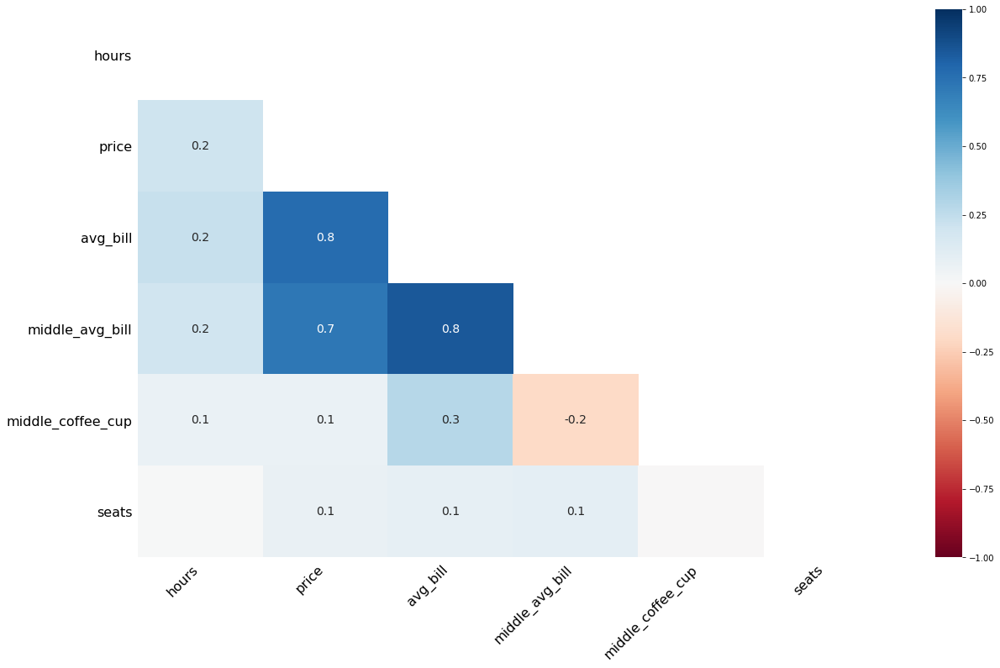

In [14]:
msno.heatmap(data)

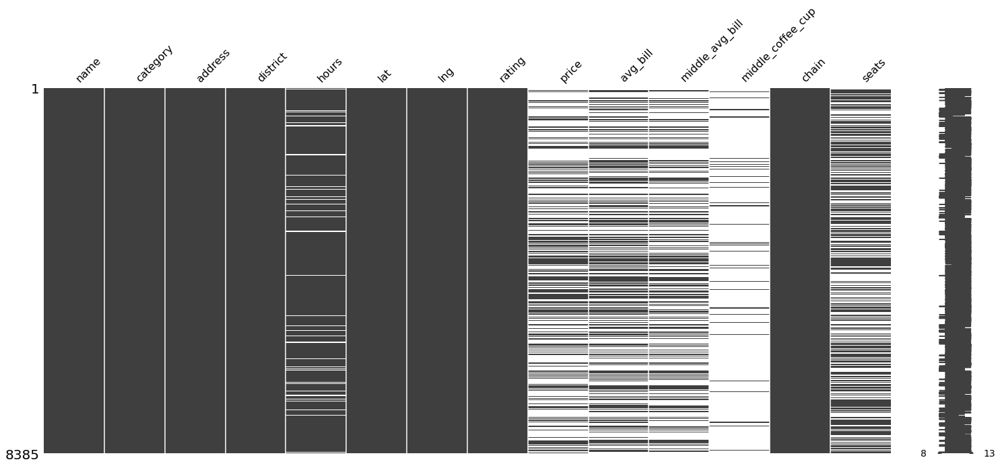

In [15]:
msno.matrix(data);

In [16]:
# check
# пропущенные значения бары

def pass_value_barh(df):
    try:
        (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), rot = -5, legend = False, fontsize = 16)
            .set_title('Пример' + "\n", fontsize = 22, color = 'SteelBlue')    
        );    
    except:
        print('пропусков не осталось :) или произошла ошибка в первой части функции ')

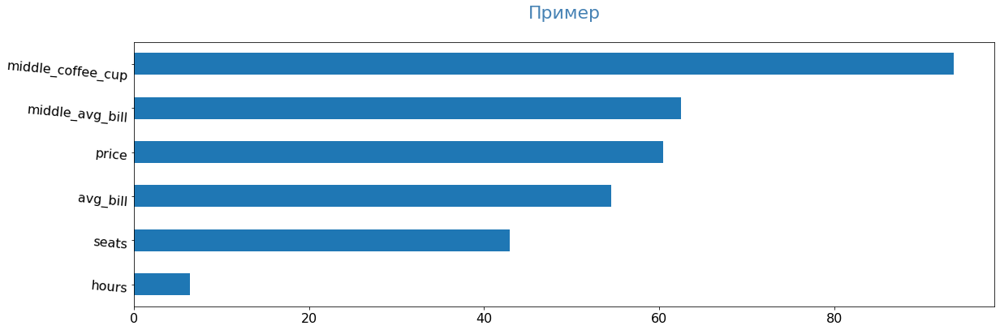

In [17]:
pass_value_barh(data)

In [18]:
data['street']=data['address'].str.split(", ").str[1]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


В датасет добавлен столбец 'street' с указанием улицы, на которой расположено заведение.

In [19]:
data['is_24/7']=data['hours']. str.contains('ежедневно' and 'круглосуточно')
data['is_24/7']
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8385 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8385 non-null   object 
 1   category           8385 non-null   object 
 2   address            8385 non-null   object 
 3   district           8385 non-null   object 
 4   hours              7851 non-null   object 
 5   lat                8385 non-null   float64
 6   lng                8385 non-null   float64
 7   rating             8385 non-null   float64
 8   price              3313 non-null   object 
 9   avg_bill           3813 non-null   object 
 10  middle_avg_bill    3146 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8385 non-null   int64  
 13  seats              4783 non-null   float64
 14  street             8385 non-null   object 
 15  is_24/7            7851 non-null   object 
dtypes: float64(6), int64(1),

В датасет добавлен столбец 'is_24/7' с признаком, работает ли заведение ежедневно и круглосуточно.

In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8385 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8385 non-null   object 
 1   category           8385 non-null   object 
 2   address            8385 non-null   object 
 3   district           8385 non-null   object 
 4   hours              7851 non-null   object 
 5   lat                8385 non-null   float64
 6   lng                8385 non-null   float64
 7   rating             8385 non-null   float64
 8   price              3313 non-null   object 
 9   avg_bill           3813 non-null   object 
 10  middle_avg_bill    3146 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8385 non-null   int64  
 13  seats              4783 non-null   float64
 14  street             8385 non-null   object 
 15  is_24/7            7851 non-null   object 
dtypes: float64(6), int64(1),

In [21]:
data.seats.describe()

count    4783.000000
mean      108.064604
std       121.616975
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Столбец с количеством посадочных мест содержит только 4783 значений из 8385 записей. 

In [22]:
data_seats_median = data.groupby('category')['seats'].median().round(0)
data_seats_median 

category
бар,паб            82.0
булочная           50.0
быстрое питание    67.0
кафе               60.0
кофейня            80.0
пиццерия           55.0
ресторан           86.0
столовая           76.0
Name: seats, dtype: float64

Согласно проведенного анализа, установлено медианное значение посадочных мест по категориям заведений:  
    бар,паб	82.0  
булочная	50.0  
быстрое питание	67.0  
кафе	60.0  
кофейня	80.0  
пиццерия	55.0  
ресторан	86.0  
столовая	76.0  

Text(0, 0.5, 'Категория заведения')

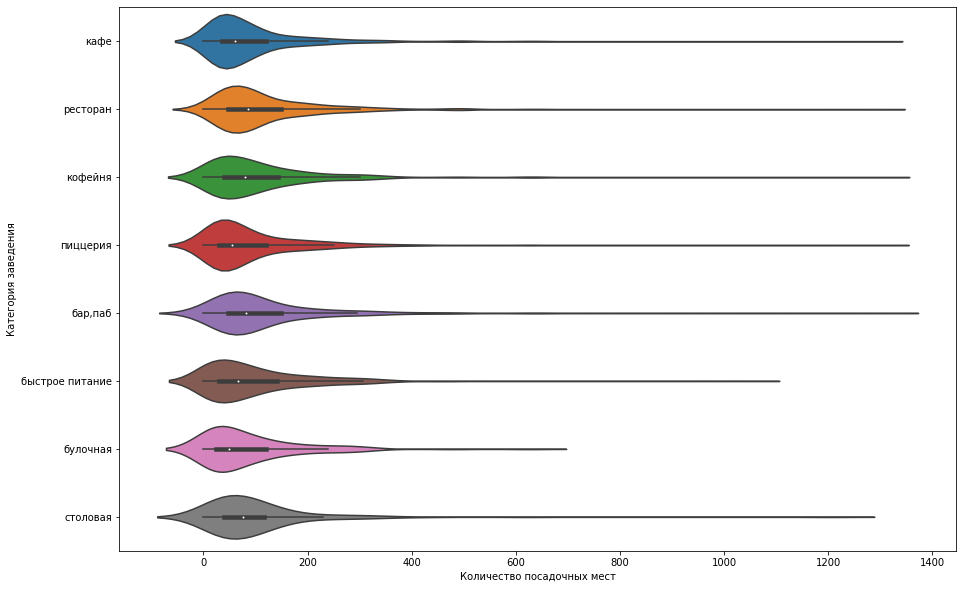

In [23]:
plt.figure(figsize=(15, 10))
ax=sns.violinplot(x='seats', y='category', data=data,grid=True)
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')

Согласно построенной диаграммы Violinplot с данными о количестве посадочных мест по заведениям разных категорий выбросами можно признать данные о заведениях, где посадочных мест более 400.

In [24]:
data.loc[data['seats']>400,'seats']=np.nan

Text(0, 0.5, 'Категория заведения')

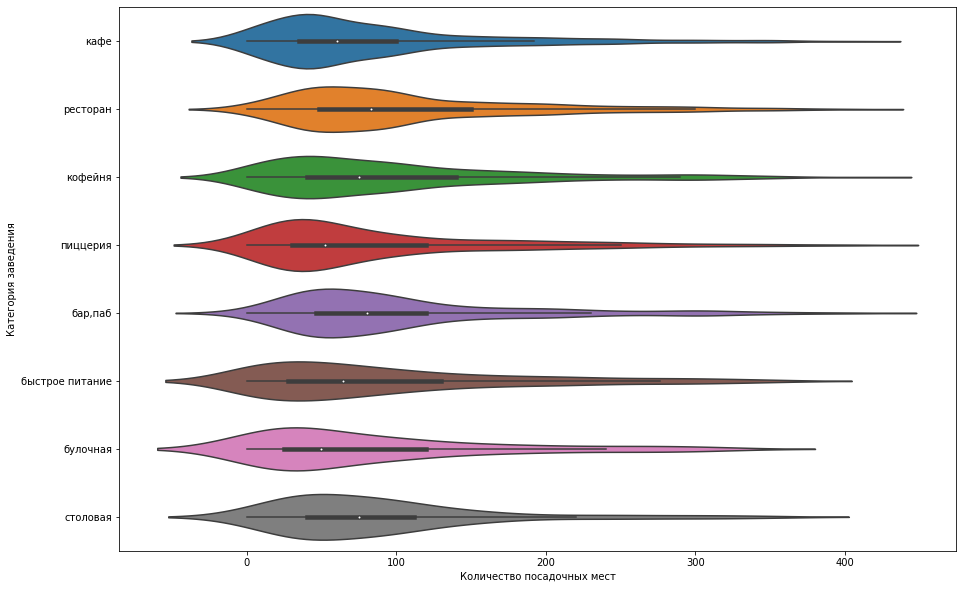

In [25]:
plt.figure(figsize=(15, 10))
ax=sns.violinplot(x='seats', y='category', data=data,grid=True)
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')

<b> Промежуточные выводы  после выполнения раздела проекта  </b>  

Исследован датафрейм  с информацией о заведения общественного питания Москвы.  
В датафрейме представлена информация о 8406 заведениях.  
В рамках выполнения предобработки выполнен поиск и удаление явных и неявных дубликатов, поиск пропусков в данных.  
Проведен анализ пропусков данных на предмет необходимости замены пропусков какими-либо значениями.  
В результате анализа выявлено, что пропуски в большинстве данных не являются критичными, часть решено оставить незаполненными.  
Выполнена визуализация данных по посадочным местам в зависимости от категории, выявлены выбросы - заведения с количеством мест более 400, указанные выбросы заменены на пропуски.   
Также выполнено приведение названий и значений столбцов к нижнему регистру для удобства анализа, выполнена приведение к одному наименованию однородных заведений.  

<b>3. Анализ данных</b>

In [26]:
#подготовка сгруппированной таблицы для последующего анализа
data_category= data.groupby('category').agg({'name':'count', 'seats':'median','chain':'sum'})\
                .round(0).sort_values(by='name').reset_index()

# построение столбчатой диаграммы 
fig = px.bar(data_category, x='name', y='category', text='name' )
fig.update_layout(title='Количество заведений по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категории заведений')
fig.show()

Согласно визуализации в данных представлены следующие категории заведений:  
- столовая 
- ресторан
- пиццерия  
- кофейня  
- кафе  
- быстрое питание  
- булочная  
- бар, паб  

Наибольшее количество заведений относятся к категории "кафе" (2367).  
На втором месте по количеству заведений стоит категория "рестораны" (2036).  
Третье место занимают заведения категории "кофейня" (1413).  
Далее идут заведения категории "бар,паб" (764), пиццерии (632) и заведения быстрого питания (602).  
Наименьшее количество заведений принадлежит категориям "столовая" (315) и "булочная" - 256. 

In [27]:
data_category=data_category.sort_values(by='seats', ascending=False)
fig = px.bar(data_category, x='category', y='seats', text='seats', color='seats')
fig.layout.coloraxis.colorbar.title = 'Количество посадочных мест'
fig.update_layout(title='Количество посадочных мест по категориям',
                   xaxis_title='Категории заведений',
                   yaxis_title='Количество посадочных мест')
fig.show()

Исследовано количество посадочных мест в местах по категориям. Анализ произведен из показателя медианного целочисленного количества посадочных мест по каждой категории.  

Согласно проведенного анализа наибольшее количество посадочных мест у ресторанов (83), баров (80), кофеен (75) и столовых (75).  
Далее со значительным снижением количества посадочных мест следуют заведения быстрого питания (64), кафе (60), пиццерии (52) и булочные (50).  
Исходя из указанных показателей наиболее перспективными направлениями для открытия новых заведений являются категории первой тройки по количеству посадочных мест - рестораны, бары и кофейни.

In [28]:
data_seats_grouped=data.groupby('category').agg({'name':'count','seats':'count'}).reset_index()
data_seats_grouped['%total']=round(data_seats_grouped['seats']/data_seats_grouped['name']*100,2)
data_seats_grouped

,category,name,seats,%total
0,"бар,паб",764,449,58.77
1,булочная,256,146,57.03
2,быстрое питание,602,344,57.14
3,кафе,2367,1183,49.98
4,кофейня,1413,732,51.80
5,пиццерия,632,421,66.61
6,ресторан,2036,1228,60.31
7,столовая,315,161,51.11


In [29]:
data2= data.loc[data['category']=='булочная'].groupby('name').agg({'seats':'median'}).sort_values(by='seats', ascending=False)
data2.loc[data2['seats']>80]

,seats
name,
пурмарили,320.0
печорин,290.0
хлебо mania,276.0
хлеб да выпечка,276.0
шеф concept,273.0
шашлык,240.0
минутка,240.0
горячая выпечка,240.0
три финика,240.0


<br />Анализ столбца 'seats' при группировке по категориям заведений показывает, что данные о посадочных местах заполнены в среднем на 50-60%.  
        
Кроме того, действительно, неадекватно большое медианное значение посадочных мест для булочных - 50. Либо допущены ошибки при внесении данных, либо неверно выбрана категория заведения.  
        
При анализе категории "булочная" по количеству посадочных мест видно, что имеется большое количество заведений, где количество посадочных от 80 и выше.
        
Причина может быть следующей.  
        
По условиям проекта, датасет сформирован из информации,  размещённой в сервисе Яндекс Бизнес, которая могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.  
        
С большой вероятностью информация в столбце seats малоинформативна. 
        
Можно по данной категории оформить количество мест более 10 выбросами, однако в дальнейшем этот столбец в анализе не применяется, так что не уверена, что это стоит делать.

In [30]:
data_chain=data.groupby('chain')['name'].count().reset_index()
data_chain.loc[0,'chain']='не сетевые заведения'
data_chain.loc[1,'chain']='сетевые заведения'
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=data_chain['chain'], # указываем значения, которые появятся на метках сегментов
                             values=data_chain['name'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Cоотношение сетевых и несетевых заведений', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='',
                                    showarrow=False)])
sns.color_palette("mako", as_cmap=True)
fig.show()

Согласно данных о количестве сетевых и несетевых заведений в датасете большая часть заведений не являются сетевыми - 5120 (61,9%).  
Сетевых заведений в датасете 3149 (38,1%).

In [31]:
data_category['chain_%']=round(data_category['chain']/data_category['name']*100,2)
data_category=data_category.sort_values(by='chain_%', ascending=False)
fig = px.bar(data_category, x='category', y='chain_%', text='chain_%' )
fig.update_layout(title='% сетевых заведений по категориям',
                   xaxis_title='Категории заведений',
                   yaxis_title='% сетевых заведений')
fig.show()

Проведен анализ количества сетевых заведений по категориям.  
Наиболее часто сетевыми заведениями являются булочные (61,3%).  
Также часто сетевыми являются пиццерии (52,2%) и кофейни (50,9%).  
Рестораны, кафе и заведения быстрого питания являются сетевыми в 32-38% случаев.  
Реже всех являются сетевыми бары и пабы (22%).

In [32]:
data_name=data.loc[data['chain']==1].groupby('name').agg({'chain':'count', 'category':'unique'})\
            .sort_values(by='chain', ascending=False).head(15).reset_index()
data_name

,name,chain,category
0,шоколадница,120,"[кофейня, кафе]"
1,домино'с,76,[пиццерия]
2,додо пицца,74,[пиццерия]
3,one price coffee,71,[кофейня]
4,яндекс лавка,69,[ресторан]
5,cofix,65,[кофейня]
6,prime,50,"[ресторан, кафе]"
7,хинкальная,44,"[быстрое питание, кафе, ресторан, столовая, ба..."
8,кофепорт,42,[кофейня]
9,кулинарная лавка братьев караваевых,39,[кафе]


In [33]:
fig = px.bar(data_name, x='chain', y='name', text='chain',color='chain')
fig.update_layout(title='Количество заведений в сети',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название сети')
fig.layout['coloraxis']['colorbar']['title']['text'] = 'Количество заведений'
sns.color_palette("husl", 8)
fig.show()

Произведена группировка данных по названиям заведений с определением топ-15 популярных сетей в Москве.  
В указанный список  по количеству заведений, входящих в сеть, вошли следующие заведения:  
-	шоколадница	(120)	- кофейня  
-	домино'с пицца	(76)	- пиццерия  
-	додо пицца	(74)	- пиццерия  
-	one price coffee	(71)	- кофейня  
-	яндекс лавка	(69)	- ресторан  
-	cofix	(65)	- кофейня  
-	prime	(50)	- ресторан  
-	хинкальная	(44)	- быстрое питание  
-	кофепорт	(42)	- кофейня  
-	кулинарная лавка братьев караваевых	(39)	- кафе  
-	теремок	(38)	- быстрое питание  
-	чайхана	(37)	- кафе  
-	cofefest	(32)	- кофейня  
-	буханка	(32)	- булочная  
-	му-му	(27)	-  быстрое питание

В основном, указанные заведения принадлежат к категориям "пиццерия", "кафе", "кофейня".  
Объединяющим признаком для указанных заведений является их принадлежность к среднему ценовому диапазону.

In [34]:
data_name['category']=data_name['category'].astype(str)
data_name['category']=data_name['category'].str.split("'").str[1]
data_name

,name,chain,category
0,шоколадница,120,кофейня
1,домино'с,76,пиццерия
2,додо пицца,74,пиццерия
3,one price coffee,71,кофейня
4,яндекс лавка,69,ресторан
5,cofix,65,кофейня
6,prime,50,ресторан
7,хинкальная,44,быстрое питание
8,кофепорт,42,кофейня
9,кулинарная лавка братьев караваевых,39,кафе


In [35]:
data_name_grouped=data_name.groupby('category').agg({'chain':'sum'})\
                    .assign(chain_total=lambda x: round(x / x.sum(),2))\
                    .reset_index().sort_values(by='chain', ascending=False)
fig = px.bar(data_name_grouped, x='category', y='chain_total', text='chain_total' )
fig.update_layout(title='% категорий в ТОП-15 ',
                   xaxis_title='Категории заведений',
                   yaxis_title='Доля')
fig.show()

In [36]:
data_name_grouped

,category,chain,chain_total
3,кофейня,330,0.40
5,ресторан,157,0.19
4,пиццерия,150,0.18
2,кафе,103,0.13
1,быстрое питание,44,0.05
0,булочная,32,0.04


In [37]:
data_district=data.groupby(['district','category']).agg({'name':'count'})\
            .sort_values(by='name').reset_index()
data_district.rename(columns= {'district':'Округа'}, inplace = True)
# 
fig = px.bar(data_district, y='category', x='name', color='Округа', title='Разбивка категорий заведений по округам',
             text='name')
fig.update_layout( title='Разбивка категорий заведений по округам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория сети')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Произведена группировка данных по округам Москвы с разбивкой на категории заведений.  
В датасете представлены данные по следующим округам Москвы:  
- Восточный административный округ  
- Западный административный округ  
- Северный административный округ  
- Северо-Восточный административный округ  
- Северо-Западный административный округ  
- Центральный административный округ  
- Юго-Восточный административный округ  
- Юго-Западный административный округ  
- Южный административный округ  

Построен график с отображением общего количества заведений по категориям и количества заведений каждой категории по районам. 

In [38]:
data_rating=data.groupby(['category']).agg({'rating':'mean'}).round(2).sort_values(by='rating',ascending=False).reset_index()
data_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [39]:
fig = px.bar(data_rating, x='category', y='rating', text='rating')
fig.update_layout(title='Рейтинги категорий заведений',
                   xaxis_title='Категория',
                   yaxis_title='Рейтинг')
fig.show()

In [40]:
fig = px.bar(data_rating, x='category', y='rating', text='rating')
fig.update_layout(title='Рейтинги категорий заведений (Детальная визуализация)',
                   xaxis_title='Категория',
                   yaxis_title='Рейтинг (диапазон оценок от 4,0 до 4,4)')
fig.update_yaxes(range=[4, 4.4])
fig.show()

Выполнен расчет усредненных рейтингов различных категорий заведений с построением визуализации.  
Рейтинги заведений по категориям общепита варьируются от 4,05 (заведения быстрого питания) до 4,39 (бары и пабы).

In [41]:
data_rating_district=data.groupby(['district']).agg({'rating':'mean'}).round(2).reset_index()

In [42]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Построена фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.  
Согласно визуализации наибольший рейтинг имеют заведения, расположенные в Центральном округе.  
Далее по рейтингу идут заведения Северо-западного  и Западного округов.  
Наименьший рейтинг имеют заведения Юго-Восточного округа.

In [43]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Все заведения датасета отображены на карте с помощью кластеров средствами библиотеки folium.

In [44]:
data_street=data.groupby(['street']).agg({'name':'count'}).sort_values(by='name', ascending=False).head(15).reset_index()
data_street

,street,name
0,проспект мира,183
1,профсоюзная улица,121
2,проспект вернадского,106
3,ленинский проспект,106
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [45]:
data_street1=data.loc[data['street'].isin(data_street['street'])].groupby(['street','category']).agg({'name':'count'}).\
                sort_values(by='name').reset_index()
data_street1.rename(columns={'street':'Улица'}, inplace = True)

In [46]:
fig = px.bar(data_street1, y='category', x='name', color='Улица', title='Разбивка категорий заведений по ТОП-15 улиц',
             text='name')
fig.update_layout(title='Разбивка категорий заведений по ТОП-15 улиц',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категории заведений')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Определен ТОП-15 улиц Москвы по количеству заведений.  
Максимальное количество заведений в г. Москва расположены на следующих улицах:  
- проспект Мира	(184)  
- Профсоюзная улица	(122)  
- проспект Вернадского	(108)  
- Ленинский проспект	(107)  
- Ленинградский проспект	(95)  
- Дмитровское шоссе	(88)  
- Каширское шоссе	(77)  
- Варшавское шоссе	(76)  
- Ленинградское шоссе	(70)  
- МКАД	(65)  
- Люблинская улица	(60)  
- улица Вавилова	(55)  
- Кутузовский проспект	(54)  
- улица Миклухо-Маклая	(49)  
- Пятницкая улица	(48)  

Построен график распределения количества заведений и их категорий по этим улицам.

In [47]:
data_street_min=data.groupby(['street']).agg({'name':'count'}).reset_index()
data_street_min=data_street_min.loc[data_street_min['name']==1]
data_grouped_min_street=data.loc[data['street'].isin(data_street_min['street'])].reset_index()
print(data_grouped_min_street['street'])
data_grouped_min_street=data_grouped_min_street.groupby(['category']).agg({'name':'count'})\
                       .reset_index()
data_grouped_min_street['%total']=round(data_grouped_min_street['name']/data_grouped_min_street['name'].sum()*100,1)
data_grouped_min_street=data_grouped_min_street.sort_values(by='%total', ascending=False)
fig = px.bar(data_grouped_min_street, x='category', y='%total', text='%total')
fig.update_layout(title='Распределение категорий заведений по признаку "Одно заведение на улице"',
                   xaxis_title='Категория заведения',
                   yaxis_title='% от общего количества')
fig.show()

0                улица бусиновская горка
1                      прибрежный проезд
2                      парк левобережный
3                        угличская улица
4      ландшафтный заказник лианозовский
                     ...                
453                        улица шкулёва
454                      улица артюхиной
455                    кузьминская улица
456                 новороссийская улица
457                   чонгарский бульвар
Name: street, Length: 458, dtype: object


Определены улицы, на которых находится только один объект общепита.  
Всего в датасете такому признаку удовлетворяют 458 улиц.  
Согласно  диаграмме  распределения категорий заведений 34,9 % указанных заведений относятся к категории кафе.  
20,3% из указанных заведений относятся к категории ресторанов.  
18,3% заведений являются кофейнями.

In [48]:
data_street_min.head()

,street,name
0,1-й автозаводский проезд,1
1,1-й балтийский переулок,1
2,1-й варшавский проезд,1
3,1-й вешняковский проезд,1
5,1-й голутвинский переулок,1


In [49]:
data_merged_one_street=data_street_min.merge(data, on='street')
data_merged_one_street=data_merged_one_street.drop(columns='name_x')
data_merged_one_street.rename(columns={'name_y':'name'}, inplace = True)
data_merged_one_street.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 458 entries, 0 to 457
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   street             458 non-null    object 
 1   name               458 non-null    object 
 2   category           458 non-null    object 
 3   address            458 non-null    object 
 4   district           458 non-null    object 
 5   hours              431 non-null    object 
 6   lat                458 non-null    float64
 7   lng                458 non-null    float64
 8   rating             458 non-null    float64
 9   price              182 non-null    object 
 10  avg_bill           194 non-null    object 
 11  middle_avg_bill    165 non-null    float64
 12  middle_coffee_cup  24 non-null     float64
 13  chain              458 non-null    int64  
 14  seats              156 non-null    float64
 15  is_24/7            431 non-null    object 
dtypes: float64(6), int64(1), o

In [50]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_merged_one_street.apply(create_clusters, axis=1)

# выводим карту
m

Визуализирована карта с расположением улиц с одним заведением.

In [51]:
data_median_bill=data.groupby(['district']).agg({'middle_avg_bill':'median'}).reset_index()
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Ценовой индикатор заведений по районам',
).add_to(m)

# выводим карту
m

Произведен расчет медианного среднего чека по заведениям общепита по округам Москвы.  
Указанная величина принята в качестве ценового индикатора района.  
Построена фоновая картограмма (хороплет) с полученными значениями для каждого района.  
Согласно построенной картограммы наиболее высоким  с большим отрывом является средний чек в Центральном и Западном округах.  
Значительно ниже средний чек  в Северо-Западном, Юго-Западном и Восточном округах.  
Самый низкий средний чек зафиксирован в Северном, Южном и Юго-Восточном округах.
Удаленность от центра прямо пропорционально влияет на средний чек в заведениях - чем дальше, тем ниже средний чек.  
Исключением из данного правила является западное направление, где отдаленность от центра незначительно влияет на средний чек.

<b> Промежуточные выводы</b>

В датасете представлены данные о 8406 заведений.  
Согласно визуализации в данных представлены следующие категории заведений:  
- столовая  
- ресторан  
- пиццерия  
- кофейня  
- кафе  
- быстрое питание  
- булочная  
- бар, паб  
Наибольшее количество заведений относятся к категории "кафе" (2378).  
На втором месте по количеству заведений стоит категория "рестораны" (2043).  
Третье место занимают заведения категории "кофейня" (1413).  
Далее идут заведения категории "бар,паб" (765), пиццерии (633) и заведения быстрого питания (603).  
Наименьшее количество заведений принадлежит категориям "столовая" (315) и "булочная" - 256.  

Исследовано количество посадочных мест в местах по категориям. Анализ произведен из показателя медианного целочисленного количества посадочных мест по каждой категории.  

Согласно проведенного анализа наибольшее количество посадочных мест у ресторанов (86), баров (82), кофеен (80) и столовых (76).  
Далее со значительным снижением количества посадочных мест следуют заведения быстрого питания (65), кафе (60), пиццерии (55) и булочные (50).  
Исходя из указанных показателей наиболее перспективными направлениями для открытия новых заведений являются категории первой тройки по количеству посадочных мест - рестораны, бары и кофейни.  

Согласно данных о количестве сетевых и несетевых заведений в датасете большая часть заведений не являются сетевыми - (61,9%). Сетевых заведений в датасете  (38,1%).  

Проведен анализ количества сетевых заведений по категориям.  
Наиболее часто сетевыми заведениями являются булочные (61,02%).  
Также часто сетевыми являются пиццерии (52,24%) и кофейни (50,86%).  
Рестораны, кафе и заведения быстрого питания являются сетевыми в 32-38% случаев.  
Реже всех являются сетевыми бары и пабы (22%).  

Произведена группировка данных по названиям заведений с определением топ-15 популярных сетей в Москве. В указанный список по количеству заведений, входящих в сеть, вошли следующие заведения:  

- шоколадница (120)  - кофейня  
- домино'с пицца (76)  - пиццерия  
- додо пицца (74)  - пиццерия  
- one price coffee (71)  - кофейня  
- яндекс лавка (69) - ресторан  
- cofix (65) - кофейня  
- prime (50) - ресторан  
- хинкальная (44) - быстрое питание  
- кофепорт (42) - кофейня  
- кулинарная лавка братьев караваевых (39) - кафе  
- теремок (38) - быстрое питание  
- чайхана (37) - кафе  
- cofefest (32) - кофейня  
- буханка (32) - булочная  
- му-му (27) - быстрое питание  

В основном, указанные заведения принадлежат к категориям "пиццерия", "кафе", "кофейня". Объединяющим признаком для указанных заведений является их принадлежность к среднему ценовому диапазону.  

Выполнен расчет усредненных рейтингов различных категорий заведений с построением визуализации. Рейтинги заведений по категориям общепита варьируются от 4,05 (заведения быстрого питания) до 4,39 (бары и пабы).  

Построена фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.  
Согласно визуализации наибольший рейтинг имеют заведения, расположенные в Центральном округе.  
Далее по рейтингу идут заведения Северо-западного и Западного округов.  
Наименьший рейтинг имеют заведения Юго-Восточного округа.  

Все заведения датасета отображены на карте с помощью кластеров средствами библиотеки folium.  

Определен ТОП-15 улиц Москвы по количеству заведений. Максимальное количество заведений в г. Москва расположены на следующих улицах:  

- проспект Мира (184)  
- Профсоюзная улица (122)  
- проспект Вернадского (108)  
- Ленинский проспект (107)  
- Ленинградский проспект (95)  
- Дмитровское шоссе (88)  
- Каширское шоссе (77)  
- Варшавское шоссе (76)  
- Ленинградское шоссе (70)  
- МКАД (65)  
- Люблинская улица (60)  
- улица Вавилова (55)  
- Кутузовский проспект (54)  
- улица Миклухо-Маклая (49)  
- Пятницкая улица (48)  

Построен график распределения количества заведений и их категорий по этим улицам.  
Определены улицы, на которых находится только один объект общепита.  
Всего в датасете такому признаку удовлетворяют 458 улиц.  
Согласно круговой диаграмме распределения категорий заведений 34,9 % указанных заведений относятся к категории кафе.  
20,3% из указанных заведений относятся к категории ресторанов.  
18,3% заведений являются кофейнями.  

Произведен расчет медианного среднего чека по заведениям общепита по округам Москвы.  
Указанная величина принята в качестве ценового индикатора района.  
Построена фоновая картограмма (хороплет) с полученными значениями для каждого района.  
Согласно построенной картограммы наиболее высоким с большим отрывом является средний чек в Центральном и Западном округах.   Значительно ниже средний чек в Северо-Западном, Юго-Западном и Восточном округах.  
Самый низкий средний чек зафиксирован в Северном, Южном и Юго-Восточном округах.  
Удаленность от центра прямо пропорционально влияет на средний чек в заведениях - чем дальше, тем ниже средний чек.  
Исключением из данного правила является западное направление, где отдаленность от центра незначительно влияет на средний чек.

<b>4. Детализированное исследование: открытие кофейни </b>

In [52]:
print("Общее количество заведений категории - кофейня в датасете -", data.loc[data['category']=='кофейня']['name'].count())
data_coffee= data.loc[data['category']=='кофейня'].groupby(['district']).\
                    agg({'name':'count','rating':'mean', 'middle_coffee_cup':'median'}).\
                                    sort_values(by='name', ascending=False).reset_index()
data_coffee['middle_coffee_cup']=data_coffee['middle_coffee_cup'].round(0)
data_coffee['rating']=data_coffee['rating'].round(2)
data_coffee_24=data.loc[data['category']=='кофейня']
data_coffee_24=data_coffee_24.loc[data_coffee_24['is_24/7']=='True']['name'].count()
print("Количество круглосуточных кофеен",data_coffee_24)

Общее количество заведений категории - кофейня в датасете - 1413
Количество круглосуточных кофеен 0


Согласно расчета 1413 заведений датасета относятся к категории "Кофейня". Круглосуточных кофеен не выявлено. 

In [53]:
fig = px.bar(data_coffee, y='district', x='name', text='name')
fig.update_layout(title='Количество кофеен по округам',
                   yaxis_title='Округ',
                   xaxis_title='Количество кофеен')
fig.show()

Наибольшее количество кофеен расположено в Центральном округе - 428 шт.  
Значительно меньше кофеен Северном (193), Северо-Восточном (159), Западном (150) округах.  
Далее по количеству кофеен идут Южный (131), Восточный (105), Юго-Западный (96) и Юго-Восточный (89) округа.  
Наименьшее количество кофеен расположено в Северо-Западном (62) округе.

In [54]:
data_coffee

,district,name,rating,middle_coffee_cup
0,Центральный административный округ,428,4.34,190.0
1,Северный административный округ,193,4.29,159.0
2,Северо-Восточный административный округ,159,4.22,162.0
3,Западный административный округ,150,4.20,189.0
4,Южный административный округ,131,4.23,150.0
5,Восточный административный округ,105,4.28,135.0
6,Юго-Западный административный округ,96,4.28,198.0
7,Юго-Восточный административный округ,89,4.23,148.0
8,Северо-Западный административный округ,62,4.33,165.0


In [55]:
fig = px.bar(data_coffee, y='district', x='rating', text='rating')
fig.update_layout(title='Рейтинг кофеен по округам',
                   yaxis_title='Округ',
                   xaxis_title='Рейтинг кофеен')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Кофейни в разных округах имеют примерно одинаковый рейтинг - 4,2 -4,35.

In [56]:
fig = px.bar(data_coffee, y='district', x='rating', text='rating')
fig.update_layout(title='Рейтинг кофеен по округам (Детальная визуализация)',
                   yaxis_title='Округ',
                   xaxis_title='Рейтинг кофеен')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.update_xaxes(range=[4.1, 4.4])
fig.show()

In [57]:
data_coffee=data_coffee.sort_values(by='middle_coffee_cup', ascending=False)
fig = px.bar(data_coffee, y='district', x='middle_coffee_cup', text='middle_coffee_cup')
fig.update_layout(title='Средняя стоимость чашки кофе по округам',
                   yaxis_title='Округ',
                   xaxis_title='Средняя стоимость чашки кофе')
fig.update_xaxes(range=[100, 200])
fig.show()
data_coffee

,district,name,rating,middle_coffee_cup
6,Юго-Западный административный округ,96,4.28,198.0
0,Центральный административный округ,428,4.34,190.0
3,Западный административный округ,150,4.20,189.0
8,Северо-Западный административный округ,62,4.33,165.0
2,Северо-Восточный административный округ,159,4.22,162.0
1,Северный административный округ,193,4.29,159.0
4,Южный административный округ,131,4.23,150.0
7,Юго-Восточный административный округ,89,4.23,148.0
5,Восточный административный округ,105,4.28,135.0


In [58]:
data_coffee_top50= data.loc[data['category']=='кофейня'].sort_values(by='middle_coffee_cup', ascending=False)\
                  .head(50).reset_index()
data_coffee_top50_g=data_coffee_top50.groupby(['name']).agg({'category':'count'}).sort_values(by='category', ascending=False)
data_coffee_top50_g.head()

,category
name,
шоколадница,16
даблби,3
"skuratov, coffee roasters",3
coffee bean,2
кофе хауз,2


Как минимум, половина из кофеен со средним чеком 250 руб.  и выше относятся к известным сетевым кофейням - Шоколадница, Даблби, Скуратов, Coffee Bean, Кофе Хауз

Произведен расчет стоимости чашки капучино в зависимости от округа.  
Наибольшая медианная цена чашки кофе выявлена в Юго-Западном округе (198), незначительно меньше стоит кофе в Центральном (190) и Западном (189)  округах.  
Далее значительно ниже стоит кофе в Северо-Западном (165), Северо-Восточном (162,5) и Северном (159) округах.  
Ниже всего стоимость чашки кофе в Восточном (135) округе.

In [59]:
data_median_bill=data.groupby(['district']).agg({'middle_avg_bill':'median'}).reset_index()

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Цена чашки кофе по округам',
).add_to(m)

# выводим карту
m

Согласно проведенного исследования наиболее перспективным округом для открытия кофейни является Северо-Западный округ Москвы по следующим причинам:  
1. Там наименьшее количество кофеен из всех округов  
2. Средний рейтинг кофеен совпадает с общим по Москве  
3. Средний чек незначительно ниже Центрального и Западного округов
4. Общий ценовой идентификатор округа приближается к высоким Центральному и Западному.  

При открытии нового заведения в Северо-Западном округе стоит ориентироваться на цену чашки кофе около 165 рублей (медианное значение по округу).

In [60]:
print('ТОП-15 улиц с самой высокой средней ценой чашки кофе и самым высоким рейтингом заведений')
print()
print(data.sort_values(by=['middle_coffee_cup', 'rating'], ascending=False)['street'].head(15))

ТОП-15 улиц с самой высокой средней ценой чашки кофе и самым высоким рейтингом заведений

2859      большая семёновская улица
5503             авиамоторная улица
3718        большая никитская улица
1769                бутырская улица
5990          3-я фрунзенская улица
2075              ходынский бульвар
4578                мясницкая улица
3580          богословский переулок
4657    большая сухаревская площадь
6687           проспект вернадского
3095                ярцевская улица
711                улица хачатуряна
1408            ленинградское шоссе
3197                 площадь победы
5076         3-й крутицкий переулок
Name: street, dtype: object


<b> Выводы</b>  

В датасете представлены данные о 8406 заведений.  
Столбцы  name, category, address, district, hours, price, avg_bill имеют тип object.  
Cтолбцы lat, lng,rating, middle_avg_bill, middle_coffee_cup, seats имеют тип float64.    
Cтолбец chain имеет тип int64.  
Дубликаты в данных не выявлены.  
Выявлены пропуски в данных следующих столбцов:  
hours — информация о днях и часах работы;  
price — категория цен в заведении;  
avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона;  
middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;  
middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;  
seats — количество посадочных мест.  
  
Все указанные пропуски не являются критичными для последующего анализа, данные пропуски можно оставить незаполненными.  
В датасет добавлен столбец 'street' с указанием улицы, на которой расположено заведение.  
В датасет добавлен столбец 'is_24/7' с признаком, работает ли заведение ежедневно и круглосуточно.  
Согласно визуализации в данных представлены следующие категории заведений:  
- столовая 
- ресторан
- пиццерия  
- кофейня  
- кафе  
- быстрое питание  
- булочная  
- бар, паб  

Наибольшее количество заведений относятся к категории "кафе" .  
На втором месте по количеству заведений стоит категория "рестораны" .  
Третье место занимают заведения категории "кофейня" .  
Далее идут заведения категории "бар,паб" , пиццерии  и заведения быстрого питания .  
Наименьшее количество заведений принадлежит категориям "столовая" и "булочная" .  

Исследовано количество посадочных мест в местах по категориям. Анализ произведен из показателя медианного целочисленного количества посадочных мест по каждой категории.

Согласно проведенного анализа наибольшее количество посадочных мест у ресторанов (86), баров (82), кофеен (80) и столовых (76).  
Далее со значительным снижением количества посадочных мест следуют заведения быстрого питания (65), кафе (60), пиццерии (55) и булочные (50).  
Исходя из указанных показателей наиболее перспективными направлениями для открытия новых заведений являются категории первой тройки по количеству посадочных мест - рестораны, бары и кофейни.  

Согласно данных о количестве сетевых и несетевых заведений в датасете большая часть заведений не являются сетевыми -  (61,8%).
Сетевых заведений в датасете  (38,2%).  

Проведен анализ количества сетевых заведений по категориям.  
Наиболее часто сетевыми заведениями являются булочные (61,3%).  
Также часто сетевыми являются пиццерии (52,2%) и кофейни (50,9%).  
Рестораны, кафе и заведения быстрого питания являются сетевыми в 32-38% случаев.  
Реже всех являются сетевыми бары и пабы (22%).

Произведена группировка данных по названиям заведений с определением топ-15 популярных сетей в Москве.  
В указанный список по количеству заведений, входящих в сеть, вошли следующие заведения:  

- шоколадница  - кофейня  
- домино'с пицца  - пиццерия  
- додо пицца  - пиццерия  
- one price coffee  - кофейня  
- яндекс лавка  - ресторан  
- cofix  - кофейня  
- prime  - ресторан  
- хинкальная  - быстрое питание  
- кофепорт  - кофейня  
- кулинарная лавка братьев караваевых  - кафе  
- теремок  - быстрое питание  
- чайхана  - кафе  
- cofefest  - кофейня  
- буханка  - булочная  
- му-му  - быстрое питание  
В основном, указанные заведения принадлежат к категориям "пиццерия", "кафе", "кофейня".  
Объединяющим признаком для указанных заведений является их принадлежность к среднему ценовому диапазону.  

Выполнен расчет усредненных рейтингов различных категорий заведений с построением визуализации.  
Рейтинги заведений по категориям общепита варьируются от 4,05 (заведения быстрого питания) до 4,39 (бары и пабы).    

Построена фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.  
Согласно визуализации наибольший рейтинг имеют заведения, расположенные в Центральном округе.  
Далее по рейтингу идут заведения Северо-западного  и Западного округов.  
Наименьший рейтинг имеют заведения Юго-Восточного округа.  

Все заведения датасета отображены на карте с помощью кластеров средствами библиотеки folium.  

Определен ТОП-15 улиц Москвы по количеству заведений.  
Максимальное количество заведений в г. Москва расположены на следующих улицах:  

проспект Мира   
Профсоюзная улица   
проспект Вернадского   
Ленинский проспект   
Ленинградский проспект   
Дмитровское шоссе   
Каширское шоссе   
Варшавское шоссе   
Ленинградское шоссе   
МКАД   
Люблинская улица   
улица Вавилова   
Кутузовский проспект   
улица Миклухо-Маклая   
Пятницкая улица   
Построен график распределения количества заведений и их категорий по этим улицам.  

Определены улицы, на которых находится только один объект общепита.  
Всего в датасете такому признаку удовлетворяют 458 улиц.  
Согласно  диаграмме  распределения категорий заведений 34,9 % указанных заведений относятся к категории кафе.  
20,3% из указанных заведений относятся к категории ресторанов.  
18,3% заведений являются кофейнями.

Произведен расчет медианного среднего чека по заведениям общепита по округам Москвы.  
Указанная величина принята в качестве ценового индикатора района.  
Построена фоновая картограмма (хороплет) с полученными значениями для каждого района.  
Согласно построенной картограммы наиболее высоким с большим отрывом является средний чек в Центральном и Западном округах.  
Значительно ниже средний чек в Северо-Западном, Юго-Западном и Восточном округах.  
Самый низкий средний чек зафиксирован в Северном, Южном и Юго-Восточном округах. Удаленность от центра прямо пропорционально влияет на средний чек в заведениях - чем дальше, тем ниже средний чек  
Исключением из данного правила является западное направление, где отдаленность от центра незначительно влияет на средний чек.  

Далее выполнено исследование на предмет перспективного места для открытия кофейни.  

Наибольшее количество кофеен расположено в Центральном округе 423.
Значительно меньше кофеен Северном (193), Северо-Восточном (159), Западном (150) округах.
Далее по количеству кофеен идут Южный (131), Восточный (105), Юго-Западный (96) и Юго-Восточный (89) округа.
Наименьшее количество кофеен расположено в Северо-Западном (62) округе.  

Произведен расчет стоимости чашки капучино в зависимости от округа.  
Наибольшая средняя цена чашки кофе выявлена в Западном округе , незначительно меньше стоит кофе в Центральном  и Юго-Западном   округах.  
Далее чуть ниже стоит кофе в Восточном  и Северном , Северо- Западном  округах.  
Ниже всего стоимость чашки кофе в Юго-Восточном  округе.  

Согласно проведенного исследования наиболее перспективным округом для открытия кофейни является Северо-Западный округ Москвы по следующим причинам:  
1. Там наименьшее количество кофеен из всех округов  
2. Средний рейтинг кофеен совпадает с общим по Москве  
3. Средний чек незначительно ниже Центрального и Западного округов
4. Общий ценовой идентификатор округа приближается к высоким Центральному и Западному.  

При открытии нового заведения в Северо-Западном округе стоит ориентироваться на цену чашки кофе около 165 рублей (среднее значение по округу).

Презентация: https://disk.yandex.ru/i/acodO_vjBiPYXA